In [1]:
import os
from glob import glob
from itertools import permutations
import pandas as pd
import numpy as np
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')


# 의문들
- ***Pixel Pattern***
    - 카테고리별 이미지 특징들은 무엇이 있을까
    - 카테고리별 '얼굴'이 차지하는 비율은 다를까
    - 마스크 상태에 따라 밝기, 명도 등이 다를까
    - 성별에 따라 얼굴 근방에 대한 픽셀 구성이 다를까
- ***Crop***: 얼굴만 crop할 수 있는 방법이 무엇이 있을까

In [2]:
RANDOM_SEED = 42
TRAIN_RAW = '../input/data/train/images'

In [3]:
data = pd.read_csv('../input/data/train/train.csv')
data.drop('race', axis=1, inplace=True)
data.head()

,id,gender,age,path
0,000001,female,45,000001_female_Asian_45
1,000002,female,52,000002_female_Asian_52
2,000004,male,54,000004_male_Asian_54
3,000005,female,58,000005_female_Asian_58
4,000006,female,59,000006_female_Asian_59


In [4]:
mask_states = ['incorrect_mask', 'mask1', 'mask2', 'mask3', 'mask4', 'mask5', 'normal']

def attach_img_path(x):    
    output = [os.path.join(x, class_) for class_ in mask_states]
    return output

def get_image_paths(x):
    name = os.path.basename(x)
    output = pd.DataFrame(np.array(attach_img_path(x)), columns=['image_path'])
    output['mask_detail'] = [m for m in mask_states]
    output['path'] = name
    return output

In [5]:
%%time
path_list = data['path'].tolist()
image_paths_raw = list(map(lambda x: get_image_paths(os.path.join(TRAIN_RAW, x)), path_list))
image_paths = pd.concat(image_paths_raw, ignore_index=True, axis=0)

data = data.merge(image_paths, how='left', on='path')
data.head(3)


CPU times: user 3.34 s, sys: 40 ms, total: 3.38 s
Wall time: 3.36 s


,id,gender,age,path,image_path,mask_detail
0,000001,female,45,000001_female_Asian_45,../input/data/train/images/000001_female_Asian...,incorrect_mask
1,000001,female,45,000001_female_Asian_45,../input/data/train/images/000001_female_Asian...,mask1
2,000001,female,45,000001_female_Asian_45,../input/data/train/images/000001_female_Asian...,mask2


In [6]:
def get_mask_class(x):
    if x == 'incorrect_mask':
        class_ = 'incorrect'
    elif x == 'normal':
        class_ = 'not_wear'
    else:
        class_ = 'wear'
    return class_


data['mask'] = data['mask_detail'].apply(lambda x: get_mask_class(x))
col_order = ['id', 'gender', 'age', 'mask', 'mask_detail', 'path', 'image_path']
data = data[col_order]
data.head(3)

,id,gender,age,mask,mask_detail,path,image_path
0,000001,female,45,incorrect,incorrect_mask,000001_female_Asian_45,../input/data/train/images/000001_female_Asian...
1,000001,female,45,wear,mask1,000001_female_Asian_45,../input/data/train/images/000001_female_Asian...
2,000001,female,45,wear,mask2,000001_female_Asian_45,../input/data/train/images/000001_female_Asian...


# EDA: Mask
## 의문들:
- "이미지 중앙부 픽셀 세로선 시퀀스 하나만으로도 마스크 착용 여부에 대한 예측이 가능하지 않을까?"
    - 1차원 시퀀스에 대해 Conv1d를 사용해보아도, 또는 LSTM을 사용해보아도 좋을 것 같다
- 주어진 이미지는 중앙부에 '정면의 얼굴'이 배치되어 있다는 특징이 있음
- 픽셀 시퀀스를 늘어놓았을 떄, 마스크 상태에 대한 구분이 효과적일듯

## NOTE
- 픽셀은 (0, 255)의 값을 가지며, 0에 가까울 수록 검정 색을, 255에 가까울 수록 흰색을 보임

In [7]:
def load_image(path, show: bool=False, grayscale: bool=False):
    for extension in ('.jpg', '.png', '.jpeg'):
        root = '/'.join(path.split('/')[:-1])
        terminal = path.split('/')[-1]
        terminal = terminal.split('.')[0] + extension
        path = os.path.join(root, terminal)
        if os.path.isfile(path):
            break

    if grayscale:
        img = np.array(Image.open(path).convert('L')) 
    else:
        img = np.array(Image.open(path).convert('RGB')) 

    if show:
        plt.imshow(img)
        plt.show()
    else:
        return img

In [8]:
mask_wear = data[data['mask'] =='wear'].reset_index(drop=True)
mask_incorrect = data[data['mask'] =='incorrect'].reset_index(drop=True)
mask_notwear = data[data['mask'] =='not_wear'].reset_index(drop=True)

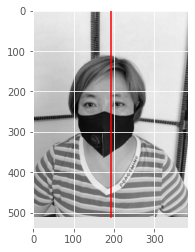

In [9]:
sample_img = load_image(mask_wear['image_path'][0], show=False, grayscale=True)
plt.imshow(sample_img, cmap='gray')
coord_x = (384//2, 384//2) # 가운데 축
coord_y = (0, 512)
plt.plot(coord_x, coord_y, c='red')
plt.show()

딱 저 위에 그린 수직선에 대한 픽셀 시퀀스의 분포를 확인하고자 한다.
- 좀더 구체적으로는, 마스크 착용 상태에 따라 그룹화한 뒤, 그룹별 통계치를 확인해보자.

In [10]:
def _get_vertial_array(img_array, v: int, grayscale: bool=False):
    if grayscale:
        output = img_array[:, v]
    else:
        output = img_array[:, v, :]
    return output

def plot_vertial_pixel_sequence(data, grayscale: bool=False, v: int=384//2, subsample_size: int=100, random_state=RANDOM_SEED, title:str=None):
    '''
    데이터셋으로부터 이미지를 N개 무작위 추출한 뒤 각각 단일 세로 픽셀 시퀀스를 추출, 시퀀스별 분포를 시각화하는 함수
    '''
    if title is None:
        title = 'Pixel sequence of People who wear Mask Correctly / Subsample Size: 100'

    np.random.seed(RANDOM_SEED)

    if len(data) < subsample_size:
        print(f"Data size is smaller than 'subsample_size({subsample_size})'")
        subsample_paths = np.random.choice(data['image_path'].tolist(), size=len(data), replace=False).tolist()
    else:
        subsample_paths = np.random.choice(data['image_path'].tolist(), size=subsample_size, replace=False).tolist()

    subsamples = []
    for sample in subsample_paths:
        sample_img = load_image(sample, show=False, grayscale=grayscale)
        vertical_sequence = _get_vertial_array(sample_img, v, grayscale=grayscale)
        if grayscale:
            subsamples.append(vertical_sequence)
        else:
            subsamples.append(vertical_sequence.mean(axis=-1))

    subsamples = pd.DataFrame(np.vstack(subsamples)) 
    subsamples = subsamples.reset_index().rename({'index':'id'}, axis=1) # rename
    subsamples = subsamples.melt(id_vars='id') # melt for visualization

    fig, ax = plt.subplots(1, 1, figsize=(20, 5))

    ax.set_xlim(0, 512)
    ax.set_ylim(0-5, 255+5) # margin
    sns.lineplot(x='variable', y='value', hue='id', data=subsamples, ax=ax)

    ax.set_title(title)
    plt.show()

    return fig, ax


def get_vertial_pixel_sequence(data, grayscale: bool=False, v: int=384//2, subsample_size: int=100, random_state=RANDOM_SEED):
    '''
    데이터셋으로부터 이미지를 N개 무작위 추출한 뒤 각각 단일 세로 픽셀 시퀀스를 추출하는 함수
    '''
    np.random.seed(RANDOM_SEED)

    if len(data) < subsample_size:
        print(f"Data size is smaller than 'subsample_size({subsample_size})'")
        subsample_paths = np.random.choice(data['image_path'].tolist(), size=len(data), replace=False).tolist()
    else:
        subsample_paths = np.random.choice(data['image_path'].tolist(), size=subsample_size, replace=False).tolist()

    subsamples = []
    for sample in subsample_paths:
        sample_img = load_image(sample, show=False, grayscale=grayscale)
        vertical_sequence = _get_vertial_array(sample_img, v, grayscale=grayscale)
        if grayscale:
            subsamples.append(vertical_sequence)
        else:
            subsamples.append(vertical_sequence.mean(axis=-1))
    subsamples = pd.DataFrame(np.vstack(subsamples)) 
    return subsamples

In [11]:
config = {
    'grayscale': False, 
    'v': 384//2,
    'subsample_size': 100,
    'random_state': RANDOM_SEED,
    'title': None
          }

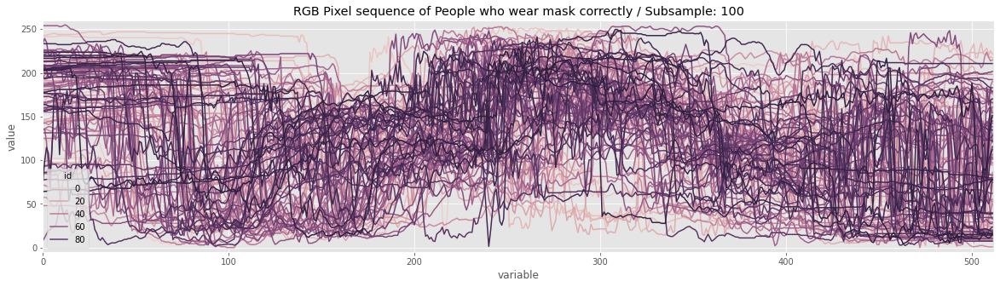

In [12]:
config['title'] = f"RGB Pixel sequence of People who wear mask correctly / Subsample: {config['subsample_size']}"
fig_mw, ax_mw = plot_vertial_pixel_sequence(mask_wear, **config) # mw: mask wear

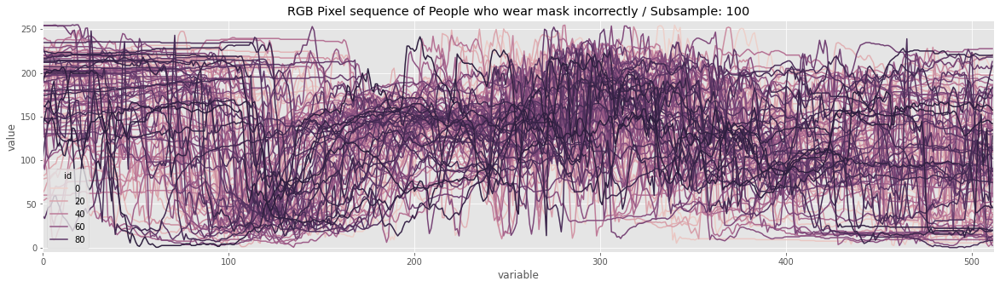

In [13]:
config['title'] = f"RGB Pixel sequence of People who wear mask incorrectly / Subsample: {config['subsample_size']}"
fig_mi, ax_mi = plot_vertial_pixel_sequence(mask_incorrect, **config) # mi: mask incorrect

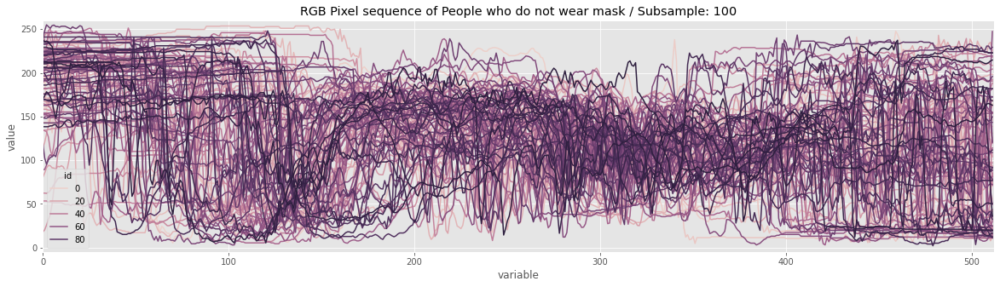

In [14]:
config['title'] = f"RGB Pixel sequence of People who do not wear mask / Subsample: {config['subsample_size']}"
fig_mn, ax_mn = plot_vertial_pixel_sequence(mask_notwear, **config) # mn: mask no

가장 앞, 가장 뒷부분은 중앙 부분보다 픽셀의 분산이 높은, 변동이 심한 것으로 보인다. 얻을 수 있는 정보가 많이 않을 것 같다.
- 그도 그럴 것이, 저 부분은 이미지 배경에 해당되는 부분일 것이기 때문에 픽셀의 분포가 어떠한 패턴이 발견될 것이라 보장하기 어렵다.

In [15]:
# 구간 분할을 그래프에 표시할 수직선 추가

ax_mw.plot([128, 128], [0, 255], color='red', lw=3)
ax_mi.plot([128, 128], [0, 255], color='red', lw=3)
ax_mn.plot([128, 128], [0, 255], color='red', lw=3)

ax_mw.plot([256, 256], [0, 255], color='red', lw=3)
ax_mi.plot([256, 256], [0, 255], color='red', lw=3)
ax_mn.plot([256, 256], [0, 255], color='red', lw=3)

ax_mw.plot([384, 384], [0, 255], color='red', lw=3)
ax_mi.plot([384, 384], [0, 255], color='red', lw=3)
ax_mn.plot([384, 384], [0, 255], color='red', lw=3)

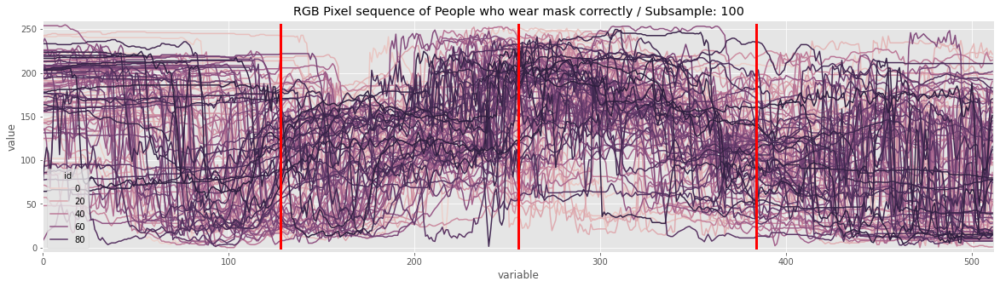

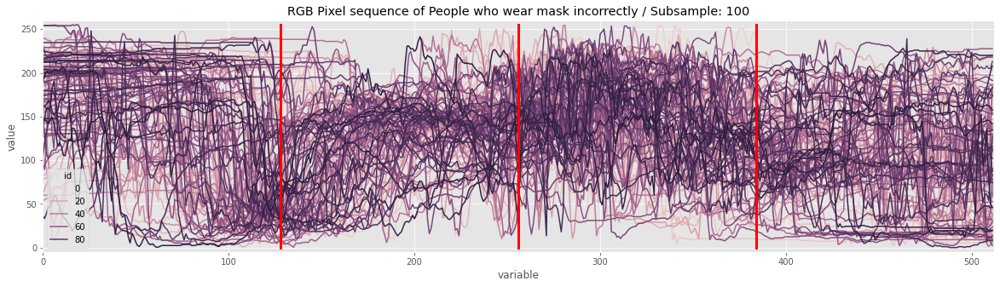

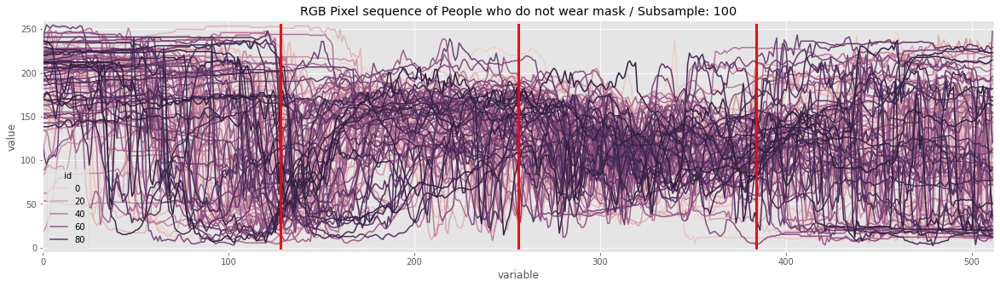

In [16]:
display(fig_mw)
display(fig_mi)
display(fig_mn)

이렇게 구간을 4개로 나누어서 픽셀별 분포를 살펴보자

### 구간 별 표준편차 파악

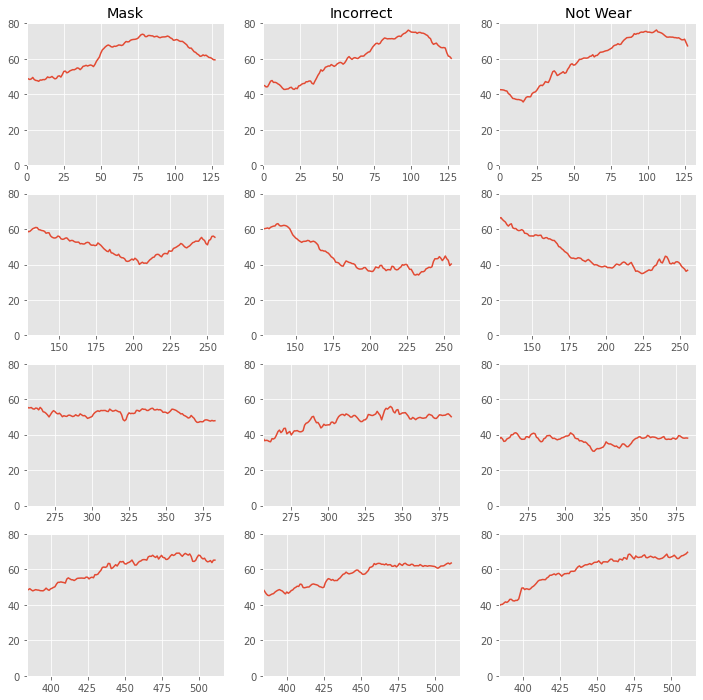

In [326]:
fig, ax = plt.subplots(4, 3, figsize=(12, 12))
points = [0, 128, 256, 384, 512]

for r in range(ax.shape[0]):
    ax[r][0].plot(get_vertial_pixel_sequence(mask_wear, **config).iloc[:, points[r]:points[r+1]].std(axis=0))
    ax[r][1].plot(get_vertial_pixel_sequence(mask_incorrect, **config).iloc[:, points[r]:points[r+1]].std(axis=0))
    ax[r][2].plot(get_vertial_pixel_sequence(mask_notwear, **config).iloc[:, points[r]:points[r+1]].std(axis=0))

    ax[r][0].set_xlim(points[r], points[r+1]+5)
    ax[r][1].set_xlim(points[r], points[r+1]+5)
    ax[r][2].set_xlim(points[r], points[r+1]+5)
    ax[r][0].set_ylim(0, 80)
    ax[r][1].set_ylim(0, 80)
    ax[r][2].set_ylim(0, 80)

    if r == 0:
        ax[r][0].set_title('Mask')
        ax[r][1].set_title('Incorrect')
        ax[r][2].set_title('Not Wear')

plt.show()

- 가로방향으로는 마스크의 상태를, 세로 방향으로는 구간을 의미
- 첫번째와 마지막 구간에서 가장 변동이 심하고, 가운데 2개의 구간은 변동이 비교적 낮은 편  
    - 정보량이 가운데 2개의 구간에 더 많다고 볼 수 있지 않을까 싶다!

## 분포 비교
- 마스크 미착용, 마스크 불완전 착용, 마스크 완전 착용 그룹별 vertical sequence 간 유사성 비교
- 시퀀스의 분포 비교에는 쿨백 라이블러 발산을 활용한다.

In [342]:
from collections import Counter

def get_pixel_dist(arr: np.array):
    '''
    픽셀별 분포를 계산. 배열 내 0부터 255까지의 픽셀이 얼만큼씩 차지하는 지 측정
    쿨백라이블러 발산 측정에 활용
    Return
        - pixel_table: []
    '''
    pixel_table = np.zeros(255)
    pixel_counts = Counter(arr)

    for pixel, freq in pixel_counts.items():
        pixel_table[pixel] = freq

    pixel_table /= pixel_table.sum()
    pixel_table += 1e-4
    return pixel_table

def get_kl_divergence(p, q):
    return sum(p*(np.log(p) - np.log(q)))

def get_kld_table(interval_num: int):
    '''
        각 마스크 상태 간 쿨백 라이블러 발산 값을 담은 테이블
        NOTE: 쿨백 라이블러 발산의 정의에 따라 해당 테이블은 symmetric하지 않다
    '''
    kld_matrix = pd.DataFrame(np.zeros((3,3)), columns=mask_classes, index=mask_classes)

    for c1, c2 in permutations(mask_classes, r=2):
        p = get_pixel_dist(interval[interval_num][c1])
        q = get_pixel_dist(interval[interval_num][c2])
        kl_div = get_kl_divergence(p, q)
        kld_matrix.loc[c1, c2] = kl_div

    return kld_matrix

In [300]:
mask_classes = ['wear', 'incorrect', 'not_wear']
config = {'grayscale': False, 'v': 384//2, 'subsample_size': 100, 'random_state':RANDOM_SEED}

# 각 구간과 마스크 상태별 그룹화
interval = {
    0: {
        'wear': get_vertial_pixel_sequence(mask_wear, **config).iloc[:, :128].mean(axis=0).values.astype('int'), 
        'incorrect': get_vertial_pixel_sequence(mask_incorrect, **config).iloc[:, :128].mean(axis=0).values.astype('int'), 
        'not_wear': get_vertial_pixel_sequence(mask_notwear, **config).iloc[:, :128].mean(axis=0).values.astype('int')
        },
    1: {
        'wear': get_vertial_pixel_sequence(mask_wear, **config).iloc[:, 128:256].mean(axis=0).values.astype('int'), 
        'incorrect': get_vertial_pixel_sequence(mask_incorrect, **config).iloc[:, 128:256].mean(axis=0).values.astype('int'), 
        'not_wear': get_vertial_pixel_sequence(mask_notwear, **config).iloc[:, 128:256].mean(axis=0).values.astype('int')
        },
    2: {
        'wear': get_vertial_pixel_sequence(mask_wear, **config).iloc[:, 256:384].mean(axis=0).values.astype('int'), 
        'incorrect': get_vertial_pixel_sequence(mask_incorrect, **config).iloc[:, 256:384].mean(axis=0).values.astype('int'), 
        'not_wear': get_vertial_pixel_sequence(mask_notwear, **config).iloc[:, 256:384].mean(axis=0).values.astype('int')
        },
    3: {
        'wear': get_vertial_pixel_sequence(mask_wear, **config).iloc[:, 384:].mean(axis=0).values.astype('int'), 
        'incorrect': get_vertial_pixel_sequence(mask_incorrect, **config).iloc[:, 384:].mean(axis=0).values.astype('int'), 
        'not_wear': get_vertial_pixel_sequence(mask_notwear, **config).iloc[:, 384:].mean(axis=0).values.astype('int')
        },
    }

In [308]:
display(get_kld_table(0)) # 구간 1
display(get_kld_table(1)) # 구간 2
display(get_kld_table(2)) # 구간 3
display(get_kld_table(3)) # 구간 4

,wear,incorrect,not_wear
wear,0.000000,1.910488,2.707113
incorrect,2.784716,0.000000,2.142901
not_wear,3.075407,2.577287,0.000000


,wear,incorrect,not_wear
wear,0.000000,1.764246,2.358622
incorrect,1.892928,0.000000,1.695419
not_wear,2.506270,0.990820,0.000000


,wear,incorrect,not_wear
wear,0.000000,3.793026,3.910791
incorrect,2.562807,0.000000,4.073979
not_wear,2.961416,4.464952,0.000000


,wear,incorrect,not_wear
wear,0.000000,2.586479,3.650562
incorrect,3.276264,0.000000,1.481218
not_wear,5.548831,3.426369,0.000000


# 정리
- 시퀀스 내 분할한 구간: 0~128, 128~256, 256~384, 384~512
- 표본 수: 100
- 랜덤 시드: 42


## 결론
### 1. 분포의 변동
- 첫번째와 마지막 구간은 변동성이 비교적 높음
- 가운데 두 구간만을 학습에 활용하는 것이 효과적일듯

### 2. 구간별 정보량
- 가운데 두 구간이 마스크 상태 간 쿨백 라이블러 발산 값이 높게, 즉 클래스 별 분포가 비교적 상이
- 특히 세번째 구간은 그 괴리가 더 커서, 모델이 파악할 만한 정보가 가장 많을 것으로 보임

### 3. 그래서?
1과 2를 모두 고려했을 떄, 변동성이 비교적 낮고, 정보량이 비교적 많은 두번째와 세번째 구간을 활용하는 것이 좋아보임.
- 또한, 이는 가로선을 기준으로도 해볼 수 있을 것으로 보임
- 이미지 리사이징에 대한 기준이 될 수도 있을듯

### 부족한 논리
- 표본 수가 100개로 신빙성을 보장할 수 없음
- 첫번째와 마지막 구간의 변동성이 '비교적' 높을 뿐, 가운데 두 놈도 사실 변동성이 크다.
- 사람의 얼굴이 가운데 부분에 걸쳐있는 채로 촬영되지 않은 사진에는 적용이 어렵다

### 앞으로 뭐 해보고 싶은데
- 가로축에 대한 파악
    - 크롭에 대한 기준, 얼굴 경계를 결정지을 만한 threshold는 없을지 알고 싶다
- LSTM 기반 모델
- Conv1D 기반 모델
- 하지만 Pretrained 모델을 넘을 수는 없겠지..

# 그렇다면, 이러한 중앙선을 잡을 방법은 무엇이 있을까?
- 서일님 의견, 유사중앙선 좌우를 기준으로 픽셀 분포를 비교, 가장 분포가 차이나지 않는 경우의 유사중앙선이 바로 얼굴의 중앙선이라 할 수 있음

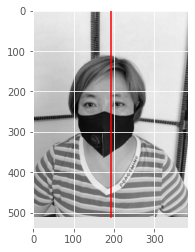

In [17]:
sample_img = load_image(mask_wear['image_path'][0], show=False, grayscale=True)
plt.imshow(sample_img, cmap='gray')
coord_x = (384//2, 384//2) # 가운데 축
coord_y = (0, 512)
plt.plot(coord_x, coord_y, c='red')
plt.show()

In [18]:
import torch

In [23]:
torch.sqrt(torch.tensor(2.)).item()

1.4142135381698608